In [ ]:
# liên kết drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# tải thư viện yolov5
# Clone YOLOv5 từ GitHub
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
!pip install -r requirements.txt

Cloning into 'yolov5'...
remote: Enumerating objects: 17483, done.
remote: Total 17483 (delta 0), reused 0 (delta 0), pack-reused 17483 (from 1)
Receiving objects: 100% (17483/17483), 16.58 MiB | 29.58 MiB/s, done.
Resolving deltas: 100% (11991/11991), done.
/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 125.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 99.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 59.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.0 MB/s eta 0:00:00
   ━━━

In [ ]:
with open('data.yaml', 'w') as f:
  f.write('train: /content/drive/MyDrive/Do_an_Thi_giac_may_tinh/Datasets/images/train\n')
  f.write('val: /content/drive/MyDrive/Do_an_Thi_giac_may_tinh/Datasets/images/val\n')
  f.write('nc: 5\n')
  f.write("names: ['NO_tumor', 'glioma', 'meningioma', 'pituitary', 'space - occupying lesion -']\n")

In [ ]:
# training yolov5
!python train.py --img 640 --batch 16 --epochs 100  --data data.yaml --weights yolov5s.pt --cache

Streaming output truncated to the last 5000 lines.
  with torch.cuda.amp.autocast(amp):
      71/99      4.38G    0.01599   0.007091   0.001658         30        640:  86% 74/86 [00:20<00:03,  3.92it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      71/99      4.38G    0.01595   0.007076   0.001657         28        640:  87% 75/86 [00:20<00:02,  3.69it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      71/99      4.38G    0.01594   0.007107   0.001662         39        640:  88% 76/86 [00:21<00:02,  3.80it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):


In [ ]:
# lưu model đã huấn luyện vào drive
!cp /content/yolov5/runs/train/exp/weights/best.pt /content/drive/MyDrive/Do_an_Thi_giac_ma
y_tinh/Datasets
!cp /content/yolov5/runs/train/exp/weights/last.pt /content/drive/MyDrive/Do_an_Thi_giac_may_tinh/Datasets

In [ ]:
# chạy thử
!python detect.py --weights /content/drive/MyDrive/Do_an_Thi_giac_may_tinh/Datasets/model/best.pt --img 640 --conf 0.25 --source /content/drive/MyDrive/Do_an_Thi_giac_may_tinh/Datasets/images/test

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
detect: weights=['/content/drive/MyDrive/Do_an_Thi_giac_may_tinh/Datasets/model/best.pt'], source=/content/drive/MyDrive/Do_an_Thi_giac_may_tinh/Datasets/images/test, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-411-gf4d8a84c Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing

Đánh giá mô hình


In [ ]:
!python val.py --weights /content/drive/MyDrive/Do_an_Thi_giac_may_tinh/Datasets/model/best.pt --data data.yaml --img-size 640 --conf-thres 0.1

val: data=data.yaml, weights=['/content/drive/MyDrive/Do_an_Thi_giac_may_tinh/Datasets/model/best.pt'], batch_size=32, imgsz=640, conf_thres=0.1, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
WARNING ⚠️ confidence threshold 0.1 > 0.001 produces invalid results
YOLOv5 🚀 v7.0-411-gf4d8a84c Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 7023610 parameters, 0 gradients, 15.8 GFLOPs
100% 755k/755k [00:00<00:00, 114MB/s]
val: Scanning /content/drive/MyDrive/Do_an_Thi_giac_may_tinh/Datasets/labels/val.cache... 395 images, 0 backgrounds, 0 corrupt: 100% 395/395 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 13/13 [00:16<00:00,  1.29s/it]
                   all        395        4

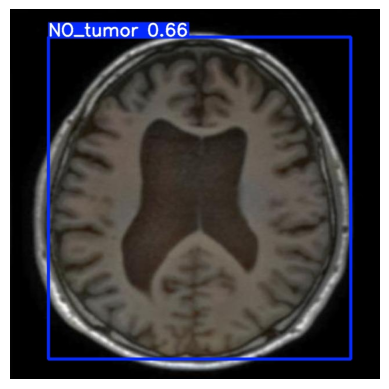

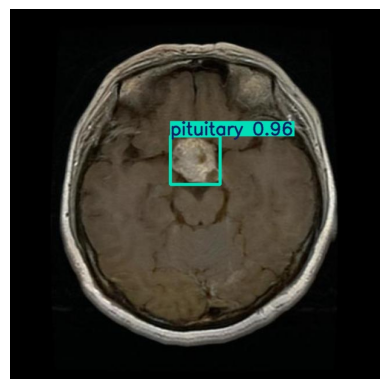

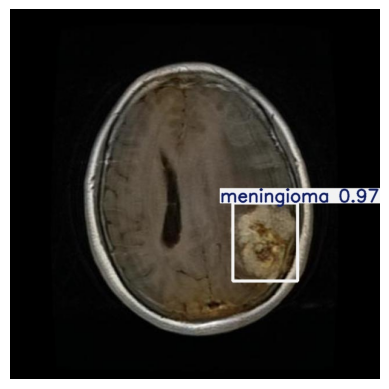

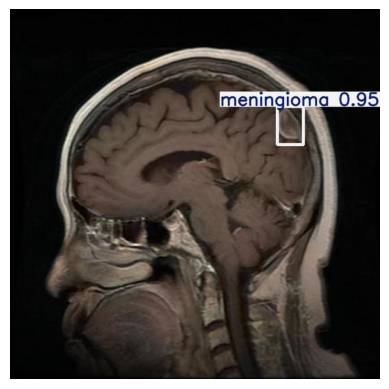

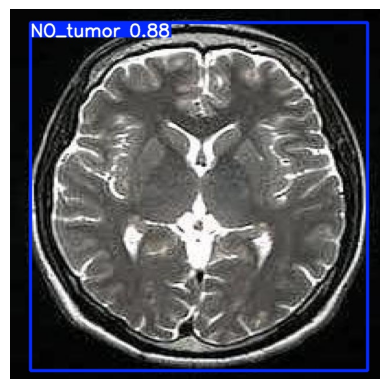

...

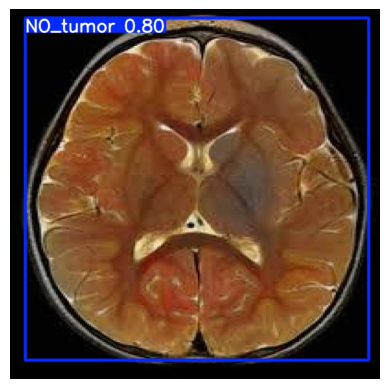

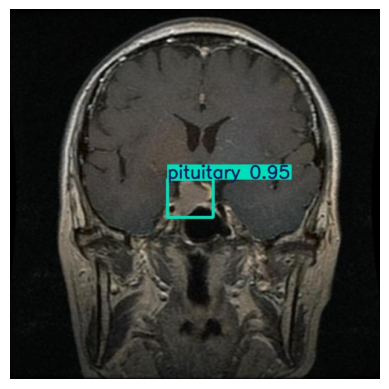

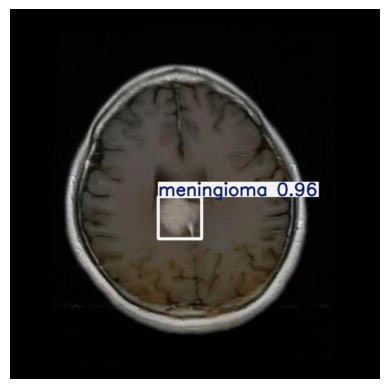

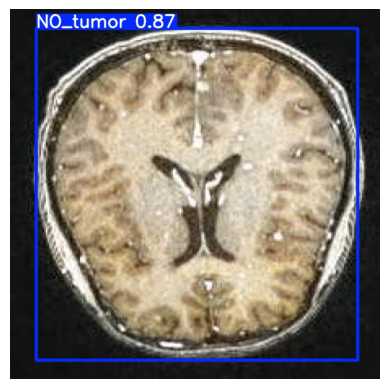

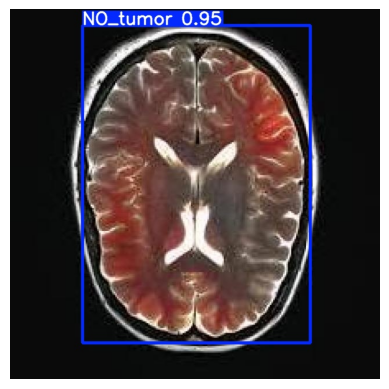

In [ ]:
# hiện thị kết quả

import cv2
import matplotlib.pyplot as plt
import os

# Đường dẫn tới thư mục chứa kết quả
result_dir = '/content/yolov5/yolov5/yolov5/runs/detect/exp'  # Hoặc chạy kết quả nào của bạn

# Lấy danh sách hình ảnh
images = os.listdir(result_dir)

# Hiển thị từng hình ảnh
for image_name in images:
    image_path = os.path.join(result_dir, image_name)
    image = cv2.imread(image_path)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()


Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
YOLOv5 🚀 2025-4-8 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 7023610 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 
/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
Saved 1 image to runs/detect/exp


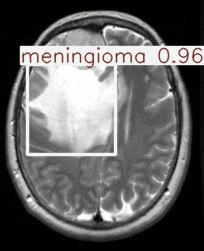

In [ ]:
import torch
from PIL import Image
import cv2
import os
from IPython.display import Image as IPyImage, display

# Load model
model = torch.hub.load('ultralytics/yolov5', 'custom', path='/content/drive/MyDrive/Do_an_Thi_giac_may_tinh/Datasets/model/best.pt', force_reload=True)

# Chạy detect
results = model('/content/drive/MyDrive/Do_an_Thi_giac_may_tinh/img5.jpg')
results.save()

# Hiển thị kết quả
result_path = 'runs/detect/exp/' + os.path.basename('/content/drive/MyDrive/Do_an_Thi_giac_may_tinh/img5.jpg')
display(IPyImage(filename=result_path))


In [ ]:
import torch
import glob
from PIL import Image
import matplotlib.pyplot as plt
import os

# ===== Đường dẫn thư mục ảnh trong Google Drive =====
folder_path = 'https://drive.google.com/drive/folders/1diocBT2ZqoXmsMtwqkHR1E7GcT997Vpk?usp=drive_link*.jpg'

# ===== Load mô hình YOLOv5 đã huấn luyện =====
model = torch.hub.load('ultralytics/yolov5', 'custom', path='/content/drive/MyDrive/Do_an_Thi_giac_may_tinh/Datasets/model/best.pt', force_reload=True)

# ===== Lấy danh sách tất cả ảnh trong thư mục =====
image_paths = glob.glob(folder_path)

# ===== Tùy chỉnh số cột khi hiển thị ảnh =====
cols = 3
rows = (len(image_paths) + cols - 1) // cols
plt.figure(figsize=(15, rows * 5))

# ===== Duyệt và hiển thị từng ảnh =====
for idx, img_path in enumerate(image_paths):
    results = model(img_path)
    results.render()  # Vẽ khung bbox vào ảnh

    img = Image.fromarray(results.ims[0])  # Chuyển ảnh từ numpy về PIL để hiển thị
    plt.subplot(rows, cols, idx + 1)
    plt.imshow(img)
    plt.title(os.path.basename(img_path))
    plt.axis('off')

plt.tight_layout()
plt.show()


Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
YOLOv5 🚀 2025-4-8 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 7023610 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 


Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
YOLOv5 🚀 2025-4-8 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 7023610 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 
/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
Saved 1 image to runs/detect/exp8


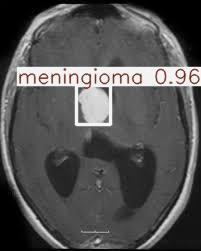

In [ ]:
import torch
from PIL import Image
import cv2
import os
from IPython.display import Image as IPyImage, display

# Load model
model = torch.hub.load('ultralytics/yolov5', 'custom', path='/content/drive/MyDrive/Do_an_Thi_giac_may_tinh/Datasets/model/best.pt', force_reload=True)

# Chạy detect
results = model('/content/drive/MyDrive/Do_an_Thi_giac_may_tinh/img7.jpg')
results.save()

# Hiển thị kết quả
result_path = 'runs/detect/exp6/' + os.path.basename('/content/drive/MyDrive/Do_an_Thi_giac_may_tinh/img7.jpg')
display(IPyImage(filename=result_path))


In [ ]:
!python train.py --weights '/content/drive/MyDrive/Do_an_Thi_giac_may_tinh/Datasets/model/last.pt' --epochs 10 --data data.yaml --img 640


wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2025-05-28 19:35:16.773374: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1748460916.805884   15033 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1748460916.815595   15033 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice: (30 second timeout) 3
wandb: You chose "Don't visualize my results"
train: weights=/content/drive/MyDrive/Do_an_Thi_giac_may_tinh/Datasets/mo

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Đường dẫn đến file results.csv sau khi huấn luyện last.pt
results_path = '/content/yolov5/runs/train/exp/results.csv'  # chỉnh lại nếu là exp2, exp3...

# Đọc file
df = pd.read_csv(results_path)

# Xem tên các cột nếu cần
print(df.columns)


Index(['               epoch', '      train/box_loss', '      train/obj_loss',
       '      train/cls_loss', '   metrics/precision', '      metrics/recall',
       '     metrics/mAP_0.5', 'metrics/mAP_0.5:0.95', '        val/box_loss',
       '        val/obj_loss', '        val/cls_loss', '               x/lr0',
       '               x/lr1', '               x/lr2'],
      dtype='object')


In [ ]:
df.columns = df.columns.str.strip()


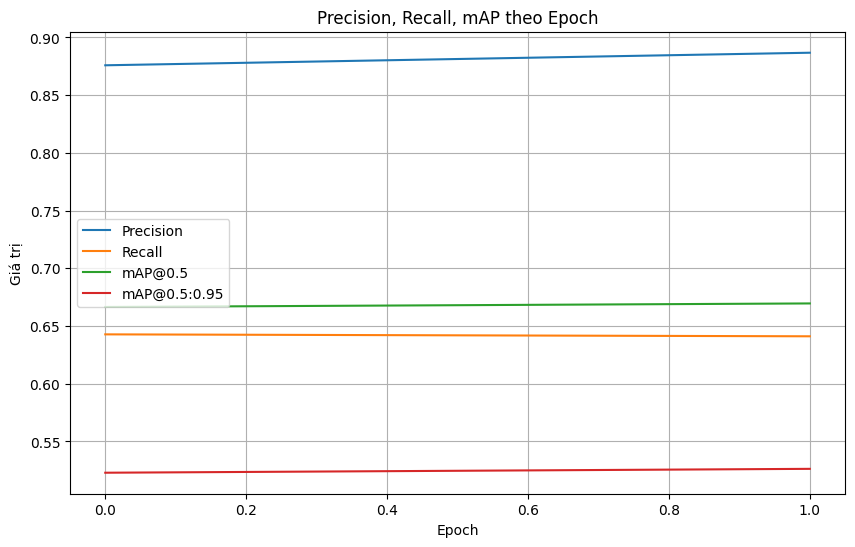

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv('/content/yolov5/runs/train/exp/results.csv')
df.columns = df.columns.str.strip()  # Làm sạch cột

# Vẽ Precision, Recall, mAP
plt.figure(figsize=(10,6))
plt.plot(df['metrics/precision'], label='Precision')
plt.plot(df['metrics/recall'], label='Recall')
plt.plot(df['metrics/mAP_0.5'], label='mAP@0.5')
plt.plot(df['metrics/mAP_0.5:0.95'], label='mAP@0.5:0.95')
plt.xlabel("Epoch")
plt.ylabel("Giá trị")
plt.title("Precision, Recall, mAP theo Epoch")
plt.grid(True)
plt.legend()
plt.show()


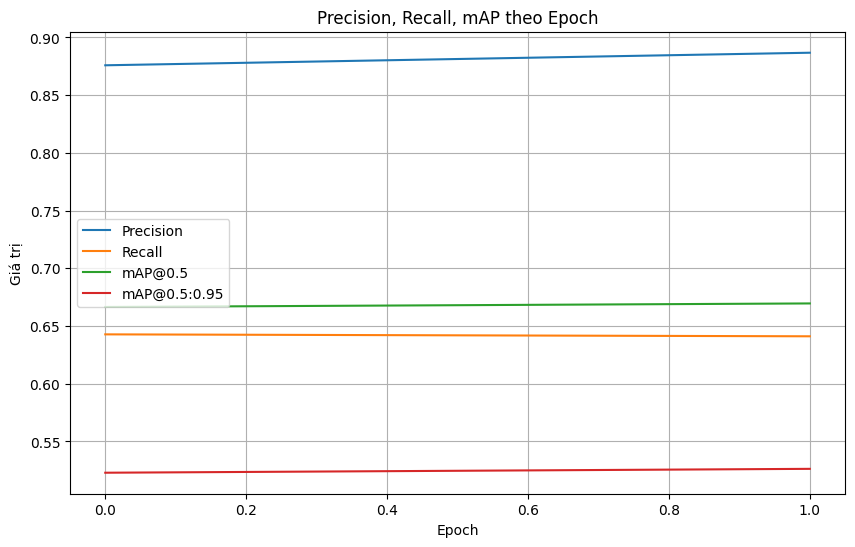

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv('/content/yolov5/runs/train/exp/results.csv')
df.columns = df.columns.str.strip()
df['epoch'] = pd.to_numeric(df['epoch'], errors='coerce')  # Chuyển epoch sang số

plt.figure(figsize=(10,6))
plt.plot(df['epoch'], df['metrics/precision'], label='Precision')
plt.plot(df['epoch'], df['metrics/recall'], label='Recall')
plt.plot(df['epoch'], df['metrics/mAP_0.5'], label='mAP@0.5')
plt.plot(df['epoch'], df['metrics/mAP_0.5:0.95'], label='mAP@0.5:0.95')
plt.xlabel("Epoch")
plt.ylabel("Giá trị")
plt.title("Precision, Recall, mAP theo Epoch")
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Đường dẫn đến file results.csv sau khi huấn luyện last.pt
results_path = '/content/yolov5/runs/train/exp3/results.csv'  # chỉnh lại nếu là exp2, exp3...

# Đọc file
df = pd.read_csv(results_path)

# Xem tên các cột nếu cần
print(df.columns)


Index(['               epoch', '      train/box_loss', '      train/obj_loss',
       '      train/cls_loss', '   metrics/precision', '      metrics/recall',
       '     metrics/mAP_0.5', 'metrics/mAP_0.5:0.95', '        val/box_loss',
       '        val/obj_loss', '        val/cls_loss', '               x/lr0',
       '               x/lr1', '               x/lr2'],
      dtype='object')


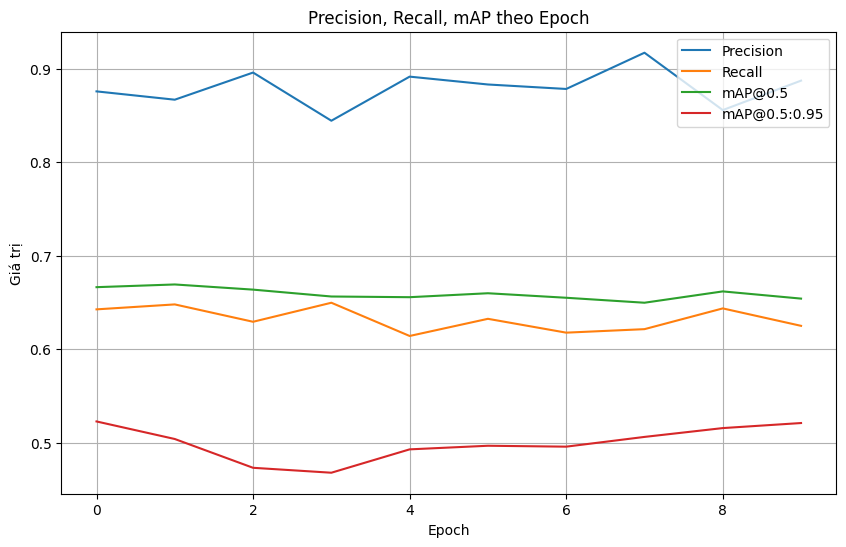

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv('/content/yolov5/runs/train/exp3/results.csv')
df.columns = df.columns.str.strip()  # Làm sạch cột

# Vẽ Precision, Recall, mAP
plt.figure(figsize=(10,6))
plt.plot(df['metrics/precision'], label='Precision')
plt.plot(df['metrics/recall'], label='Recall')
plt.plot(df['metrics/mAP_0.5'], label='mAP@0.5')
plt.plot(df['metrics/mAP_0.5:0.95'], label='mAP@0.5:0.95')
plt.xlabel("Epoch")
plt.ylabel("Giá trị")
plt.title("Precision, Recall, mAP theo Epoch")
plt.grid(True)
plt.legend()
plt.show()


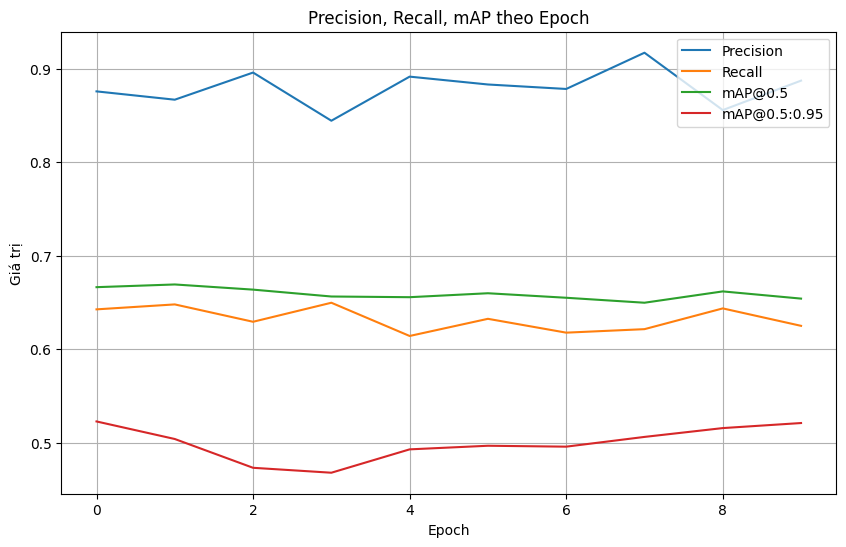

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv('/content/yolov5/runs/train/exp3/results.csv')
df.columns = df.columns.str.strip()
df['epoch'] = pd.to_numeric(df['epoch'], errors='coerce')  # Chuyển epoch sang số

plt.figure(figsize=(10,6))
plt.plot(df['epoch'], df['metrics/precision'], label='Precision')
plt.plot(df['epoch'], df['metrics/recall'], label='Recall')
plt.plot(df['epoch'], df['metrics/mAP_0.5'], label='mAP@0.5')
plt.plot(df['epoch'], df['metrics/mAP_0.5:0.95'], label='mAP@0.5:0.95')
plt.xlabel("Epoch")
plt.ylabel("Giá trị")
plt.title("Precision, Recall, mAP theo Epoch")
plt.legend()
plt.grid(True)
plt.show()
